In [1]:
!git clone https://github.com/sangyun884/dgm-hw3
%cd dgm-hw3


Cloning into 'dgm-hw3'...
remote: Enumerating objects: 13, done.
remote: Counting objects: 100% (13/13), done.
remote: Compressing objects: 100% (10/10), done.
remote: Total 13 (delta 3), reused 13 (delta 3), pack-reused 0
Receiving objects: 100% (13/13), 23.55 KiB | 2.62 MiB/s, done.
Resolving deltas: 100% (3/3), done.
/content/dgm-hw3


In [9]:
import torch
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import numpy as np
from torchvision.utils import make_grid
from network_edm import SongUNet
from tqdm import tqdm
from matplotlib import pyplot as plt

# Seed
torch.manual_seed(0)
np.random.seed(0)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


def show_traj(traj):
    traj = torch.cat(traj, dim=3)
    traj = torch.clamp(traj, -1, 1) * 0.5 + 0.5
    traj = traj.permute(1, 0, 2, 3).contiguous().view(traj.shape[1], -1, traj.shape[3])
    # Plot the trajectory
    plt.figure(figsize=(10, 10))
    plt.imshow(traj[0].cpu().numpy(), cmap='gray')
    plt.axis('off')
    plt.show()


In [10]:
class Diffusion:
    def __init__(self, net):
        self.net = net

    def sample_uniform(self, _shape):
        return torch.rand(_shape)

    def beta(self, t):
        ##### Fill in
      return 0.1 + 19.9 * t

    # def alpha(self, t):
    #     ##### Fill in
    #     return 1 - self.beta(t)

    def alpha(self, t):
        return torch.exp( -0.5 * (0.1*t + 9.95 * t**2))


    def sample_t_0(self, x0, t):
      #x_0 is torch.Size([32, 1, 28, 28])
      assert len(x0.shape) == 4, f"Expected x0 to have shape (batch_size, channels, height, width), got {x0.shape}"
      assert len(t.shape) == 1 and t.shape[0] == x0.shape[0], f"Expected t to have shape (batch_size,), got {t.shape}"
      # Reshape t to match the spatial dimensions of x0
      t = t.reshape(-1, 1, 1, 1)
      ##### Fill in
      # torch.zeros(32,1,28,28)
      al = self.alpha(t)
      variance = (1 - al**2)
      noise = torch.randn_like(x0, device=x0.device)
      xt = al * x0 + variance * noise
      #####
      return xt

    def x_to_score(self, x, xt, t):
        assert torch.is_tensor(t)
        assert len(x.shape) == 4 and x.shape == xt.shape, f"Expected x to have shape (batch_size, channels, height, width), got {x.shape}"
        assert len(t.shape) == 1 and t.shape[0] == xt.shape[0], f"Expected t to have shape (batch_size,), got {t.shape}"

        """
        Convert the denoiser output to the time-dependent score function. Hint: Use the relationship between score function and denoiser from Problem 2.
        """
        # Reshape t to match the spatial dimensions of xt
        t = t.reshape(-1, 1, 1, 1)
        ##### Fill in
        alpha_t = self.alpha(t)
        A = alpha_t/(1-  torch.square(alpha_t))
        B = -(xt/(1-torch.square(alpha_t)))
        score = A*x + B
        return score
        #####

    def compute_loss(self, xt, x0, t):
        assert torch.is_tensor(t)
        assert len(xt.shape) == 4, f"Expected xt to have shape (batch_size, channels, height, width), got {xt.shape}"
        assert len(t.shape) == 1 and t.shape[0] == xt.shape[0], f"Expected t to have shape (batch_size,), got {t.shape}"

        denoiser_output = self.forward(xt, t)
        ##### Fill in
        loss = torch.mean((denoiser_output - x0) ** 2)
        #####
        return loss

    def drift_forward(self, xt, t):
        assert len(xt.shape) == 4, f"Expected xt to have shape (batch_size, channels, height, width), got {xt.shape}"
        assert len(t.shape) == 1 and t.shape[0] == xt.shape[0], f"Expected t to have shape (batch_size,), got {t.shape}"

        # Reshape t to match the spatial dimensions of xt
        t = t.reshape(-1, 1, 1, 1)

        ##### Fill in
        return -0.5 * self.beta(t) * xt
        #####

    def diffusion_forward(self, t):
        assert torch.is_tensor(t)
        assert len(t.shape) == 1, f"Expected t to have shape (batch_size,), got {t.shape}"

        # Reshape t to match the spatial dimensions of xt
        t = t.reshape(-1, 1, 1, 1)

        ##### Fill in
        return torch.sqrt(self.beta(t))
        #####

    def drift_reverse(self, xt, t, score):
        assert len(score.shape) == 4, f"Expected score to have shape (batch_size, channels, height, width), got {score.shape}"
        assert torch.is_tensor(t)
        assert len(t.shape) == 1 and t.shape[0] == score.shape[0], f"Expected t to have shape (batch_size,), got {t.shape}"
        t = t.reshape(-1, 1, 1, 1)

        ##### Fill in
        return -0.5 *self.beta(t) * xt - self.beta(t)*score
        #####


    def diffusion_reverse(self, t): # CHECK THIS
        assert torch.is_tensor(t)
        assert len(t.shape) == 1, f"Expected t to have shape (batch_size,), got {t.shape}"
        t = t.reshape(-1, 1, 1, 1)
        ##### Fill in
        return torch.sqrt(self.beta(t))
        #####

    def get_dw(self, shape, dt, device):
      ##### Fill in
      dt_tensor = torch.tensor(dt, device=device)  # Convert dt to a tensor on the correct device

      return torch.randn(shape, device=device) * np.sqrt(dt)
      #####


    def sample_forward(self, x0, dt = 0.01):
        xt = x0
        traj = [xt]
        for t_val in np.arange(0, 1, dt):
            # t = torch.ones(xt.shape[0], device = xt.device) * t_val
            ##### Fill in
            #shape of t_tenspr is 32, all values are the same
            t_tensor = torch.full((xt.shape[0],), t_val, device=xt.device) # Create t_tensor on the same device as xt
            drift = self.drift_forward(xt, t_tensor)
            diffusion = self.diffusion_forward(t_tensor)
            dw = self.get_dw(xt.shape, dt, xt.device)  # Pass the device of xt to get_dw
            xt = xt + (drift * dt + diffusion * dw)
            # print(f' shape of the xt is {xt.shape}')
            # shape of the xt is torch.Size([32, 1, 28, 28])
            #####
            traj.append(xt)
        return traj

    def sample_reverse(self, x1, model, dt = 0.01):
        xt = x1
        traj = [xt.detach().cpu()]
        for t_val in np.arange(1, 0, -dt):
            t_tensor = torch.full((xt.shape[0],), t_val, device=xt.device) # Create t_tensor on the same device as xt
            score = model(xt, t_tensor).to(device)  # Move model output to the specified device if necessary
            ##### Fill in
            drift = self.drift_reverse(xt, t_tensor, score)
            diffusion = self.diffusion_reverse(t_tensor)
            dw = self.get_dw(xt.shape, dt, xt.device)
            xt = xt - (drift * dt + diffusion * dw)
            #####
            traj.append(xt.detach().cpu())
        return traj

    def _mnist_std(self):
        return 0.61
    def _c_skip(self, t):
        return 1 - self.alpha(t) ** 2
    def _c_out(self, t):
        term1 = (1-self.alpha(t) * self._c_skip(t)) * self._mnist_std()
        term1 = term1 ** 2
        term2 = 1 - self.alpha(t)**2
        c_out = (term1 + term2) ** 0.5
        return c_out
    def forward(self, x, t):
        c_out = self._c_out(t).view(-1, 1, 1, 1)
        c_skip = self._c_skip(t).view(-1, 1, 1, 1)
        pred = self.net(x, t) * c_out + c_skip * x
        return pred




In [11]:

device = torch.device('cuda')

batchsize = 128
num_epochs = 5

# Load MNIST Dataset
res = 28
transform = transforms.Compose([
    transforms.Resize((res, res)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

train_dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transform)
train_loader = DataLoader(train_dataset, batch_size=batchsize, shuffle=False, num_workers=4)


# Load data in the for loop
net = SongUNet(
    img_resolution = res,
    in_channels = 1,
    out_channels = 1,
    model_channels = 16,
    channel_mult = [1,1,1],
    attn_resolutions = [],
    dropout = 0
)

diffusion = Diffusion(net)
optimizer = optim.Adam(net.parameters(), lr=1e-4)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


# Q1: Visualizing forward SDE
In this problem, we will implement the forward VP-SDE and visualize the trajectory using [Euler-Maruyama discretization](https://en.wikipedia.org/wiki/Euler%E2%80%93Maruyama_method) where we simply approximate $dt$ with a small step size.

Implement sample_forward in Diffusion class. Then,

1. Print the mean and standard deviation of the forward SDE trajectory at each t and check if they converge to 0 and 1, respectively.
2. Experiment with different discretization step size and compare the results.

Hint: The differential of the Brownian motion $d\mathbf w$ follows $N(\mathbf 0, dt \mathbf I)$.


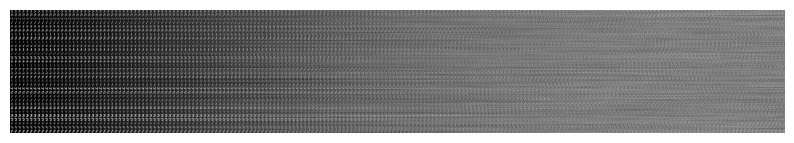

t = 0.0000, mean = -0.7496, std = 0.6034
t = 0.0050, mean = -0.7492, std = 0.6039
t = 0.0100, mean = -0.7490, std = 0.6045
t = 0.0150, mean = -0.7486, std = 0.6056
t = 0.0200, mean = -0.7476, std = 0.6063
t = 0.0250, mean = -0.7468, std = 0.6084
t = 0.0300, mean = -0.7457, std = 0.6095
t = 0.0350, mean = -0.7447, std = 0.6106
t = 0.0400, mean = -0.7431, std = 0.6122
t = 0.0450, mean = -0.7413, std = 0.6148
t = 0.0500, mean = -0.7400, std = 0.6173
t = 0.0550, mean = -0.7380, std = 0.6195
t = 0.0600, mean = -0.7347, std = 0.6218
t = 0.0650, mean = -0.7325, std = 0.6249
t = 0.0700, mean = -0.7302, std = 0.6284
t = 0.0750, mean = -0.7273, std = 0.6320
t = 0.0800, mean = -0.7234, std = 0.6355
t = 0.0850, mean = -0.7198, std = 0.6391
t = 0.0900, mean = -0.7156, std = 0.6426
t = 0.0950, mean = -0.7118, std = 0.6476
t = 0.1000, mean = -0.7081, std = 0.6517
t = 0.1050, mean = -0.7048, std = 0.6574
t = 0.1100, mean = -0.7002, std = 0.6621
t = 0.1150, mean = -0.6966, std = 0.6661
t = 0.1200, mean

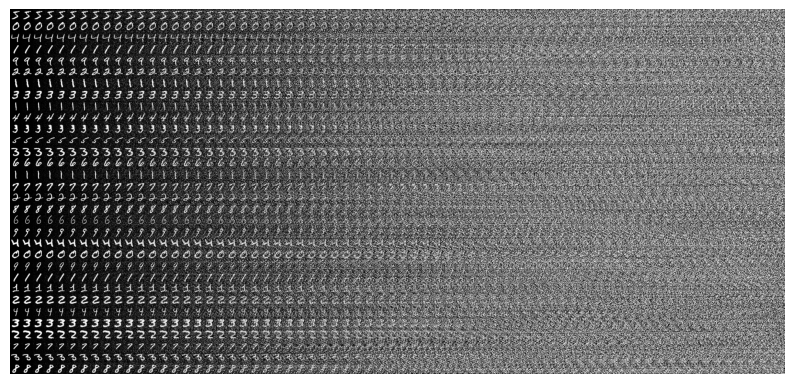

t = 0.0000, mean = -0.7496, std = 0.6034
t = 0.0150, mean = -0.7493, std = 0.6045
t = 0.0300, mean = -0.7463, std = 0.6074
t = 0.0450, mean = -0.7419, std = 0.6125
t = 0.0600, mean = -0.7372, std = 0.6211
t = 0.0750, mean = -0.7292, std = 0.6289
t = 0.0900, mean = -0.7205, std = 0.6409
t = 0.1050, mean = -0.7103, std = 0.6524
t = 0.1200, mean = -0.6984, std = 0.6675
t = 0.1350, mean = -0.6848, std = 0.6843
t = 0.1500, mean = -0.6696, std = 0.6990
t = 0.1650, mean = -0.6533, std = 0.7128
t = 0.1800, mean = -0.6360, std = 0.7302
t = 0.1950, mean = -0.6181, std = 0.7471
t = 0.2100, mean = -0.5999, std = 0.7621
t = 0.2250, mean = -0.5814, std = 0.7801
t = 0.2400, mean = -0.5609, std = 0.7984
t = 0.2550, mean = -0.5422, std = 0.8165
t = 0.2700, mean = -0.5232, std = 0.8332
t = 0.2850, mean = -0.5025, std = 0.8483
t = 0.3000, mean = -0.4839, std = 0.8614
t = 0.3150, mean = -0.4605, std = 0.8735
t = 0.3300, mean = -0.4386, std = 0.8847
t = 0.3450, mean = -0.4171, std = 0.8984
t = 0.3600, mean

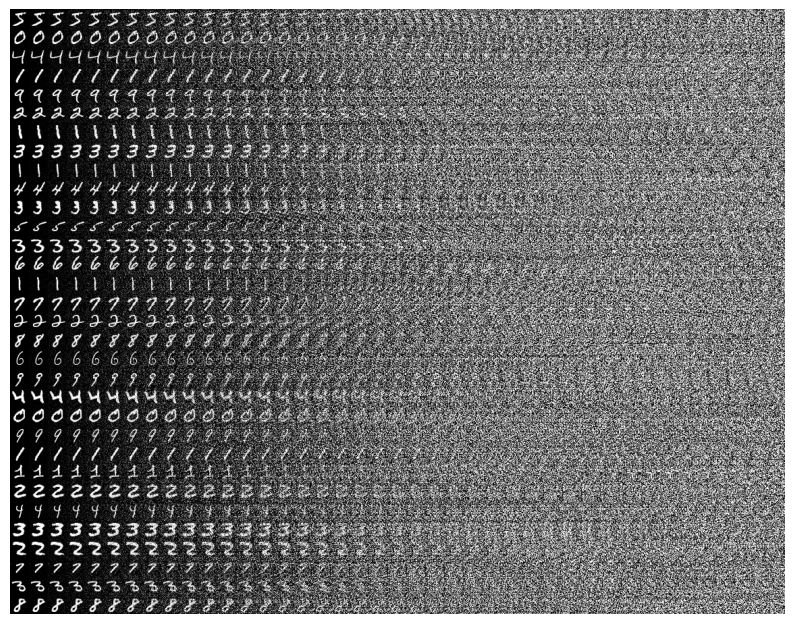

t = 0.0000, mean = -0.7496, std = 0.6034
t = 0.0250, mean = -0.7490, std = 0.6047
t = 0.0500, mean = -0.7438, std = 0.6121
t = 0.0750, mean = -0.7334, std = 0.6258
t = 0.1000, mean = -0.7182, std = 0.6444
t = 0.1250, mean = -0.7001, std = 0.6656
t = 0.1500, mean = -0.6771, std = 0.6929
t = 0.1750, mean = -0.6487, std = 0.7218
t = 0.2000, mean = -0.6204, std = 0.7523
t = 0.2250, mean = -0.5885, std = 0.7810
t = 0.2500, mean = -0.5546, std = 0.8090
t = 0.2750, mean = -0.5187, std = 0.8369
t = 0.3000, mean = -0.4834, std = 0.8641
t = 0.3250, mean = -0.4472, std = 0.8893
t = 0.3500, mean = -0.4094, std = 0.9089
t = 0.3750, mean = -0.3726, std = 0.9288
t = 0.4000, mean = -0.3385, std = 0.9452
t = 0.4250, mean = -0.3015, std = 0.9637
t = 0.4500, mean = -0.2708, std = 0.9787
t = 0.4750, mean = -0.2374, std = 0.9925
t = 0.5000, mean = -0.2104, std = 1.0028
t = 0.5250, mean = -0.1844, std = 1.0069
t = 0.5500, mean = -0.1619, std = 1.0163
t = 0.5750, mean = -0.1361, std = 1.0146
t = 0.6000, mean

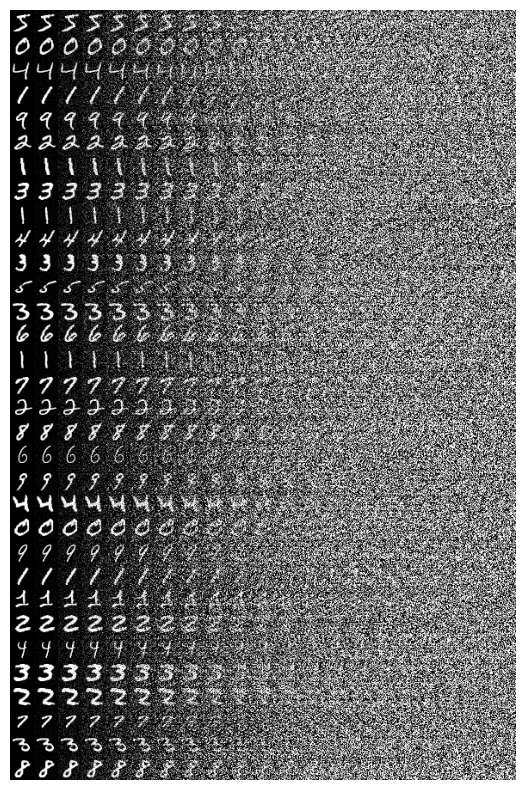

t = 0.0000, mean = -0.7496, std = 0.6034
t = 0.0500, mean = -0.7474, std = 0.6059
t = 0.1000, mean = -0.7262, std = 0.6347
t = 0.1500, mean = -0.6915, std = 0.6822
t = 0.2000, mean = -0.6399, std = 0.7418
t = 0.2500, mean = -0.5764, std = 0.8054
t = 0.3000, mean = -0.5016, std = 0.8627
t = 0.3500, mean = -0.4236, std = 0.9105
t = 0.4000, mean = -0.3505, std = 0.9612
t = 0.4500, mean = -0.2809, std = 0.9978
t = 0.5000, mean = -0.2148, std = 1.0227
t = 0.5500, mean = -0.1605, std = 1.0455
t = 0.6000, mean = -0.1079, std = 1.0551
t = 0.6500, mean = -0.0678, std = 1.0754
t = 0.7000, mean = -0.0457, std = 1.0809
t = 0.7500, mean = -0.0262, std = 1.0957
t = 0.8000, mean = -0.0226, std = 1.0980
t = 0.8500, mean = -0.0150, std = 1.1269
t = 0.9000, mean = -0.0084, std = 1.1303
t = 0.9500, mean = -0.0080, std = 1.1429
t = 1.0000, mean = -0.0065, std = 1.1420


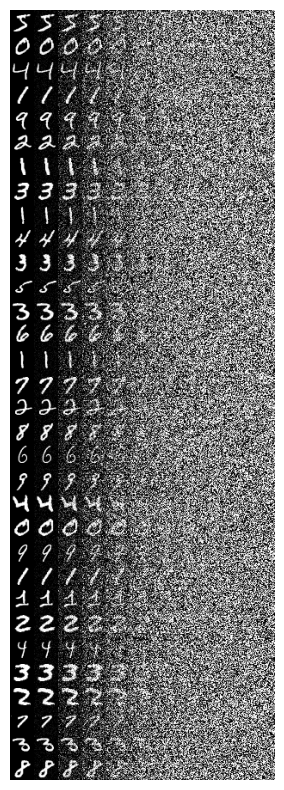

t = 0.0000, mean = -0.7496, std = 0.6034
t = 0.1000, mean = -0.7464, std = 0.6073
t = 0.2000, mean = -0.6624, std = 0.7146
t = 0.3000, mean = -0.5296, std = 0.8520
t = 0.4000, mean = -0.3648, std = 0.9752
t = 0.5000, mean = -0.2188, std = 1.0727
t = 0.6000, mean = -0.1013, std = 1.1351
t = 0.7000, mean = -0.0360, std = 1.1844
t = 0.8000, mean = -0.0138, std = 1.2368
t = 0.9000, mean = -0.0032, std = 1.2787
t = 1.0000, mean = 0.0105, std = 1.3477


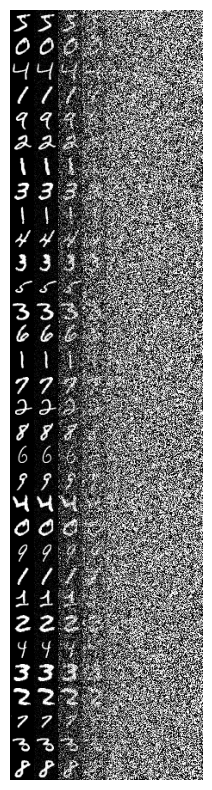

t = 0.0000, mean = -0.7496, std = 0.6034
t = 0.1500, mean = -0.7448, std = 0.6118
t = 0.3000, mean = -0.5648, std = 0.8277
t = 0.4500, mean = -0.3134, std = 1.0601
t = 0.6000, mean = -0.0881, std = 1.2181
t = 0.7500, mean = -0.0069, std = 1.3657
t = 0.9000, mean = 0.0034, std = 1.5105
t = 1.0500, mean = 0.0269, std = 1.7228


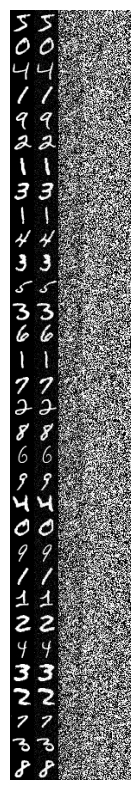

t = 0.0000, mean = -0.7496, std = 0.6034
t = 0.2500, mean = -0.7390, std = 0.6150
t = 0.5000, mean = -0.2740, std = 1.1484
t = 0.7500, mean = 0.0508, std = 1.6222
t = 1.0000, mean = -0.0468, std = 2.4125


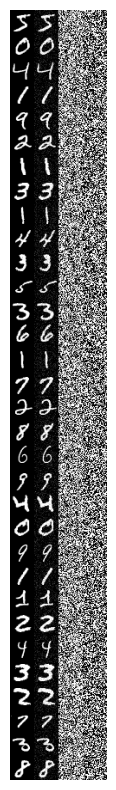

t = 0.0000, mean = -0.7496, std = 0.6034
t = 0.3500, mean = -0.7375, std = 0.6225
t = 0.7000, mean = 0.1673, std = 1.5625
t = 1.0500, mean = -0.2436, std = 3.1861


In [12]:
# Visualize the forward diffusion process
dt_lst = [0.005, 0.015, 0.025, 0.05, 0.1, 0.15, 0.25, 0.35]
for dt_item in dt_lst:
  sample_data = next(iter(train_loader))[0][:32]
  traj_forward = diffusion.sample_forward(sample_data, dt = dt_item)
  show_traj(traj_forward)

  t = 0
  for i, xt in enumerate(traj_forward):
      mean = torch.mean(xt.cpu())
      std = torch.std(xt.cpu())
      print(f"t = {t:.4f}, mean = {mean:.4f}, std = {std:.4f}")
      t += dt_item



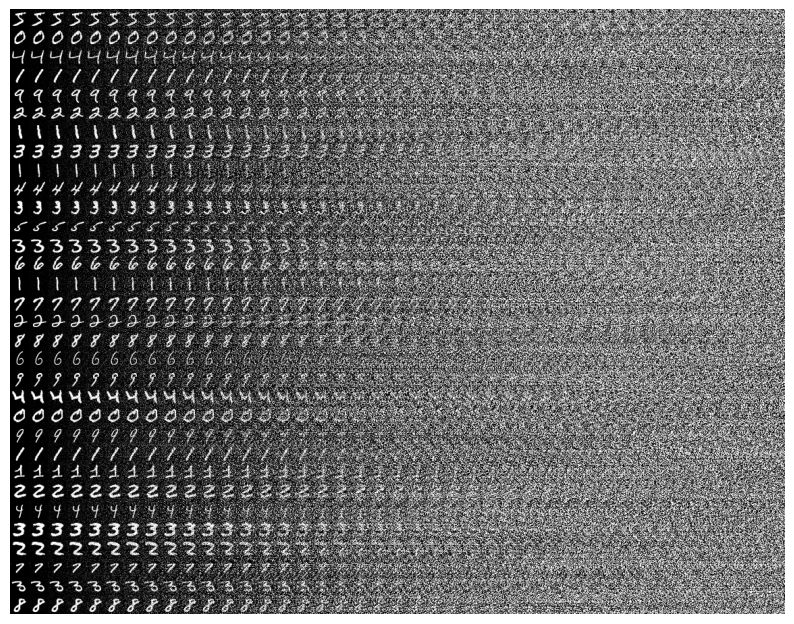

t = 0.0000, mean = -0.7496, std = 0.6034
t = 0.0250, mean = -0.7487, std = 0.6045
t = 0.0500, mean = -0.7442, std = 0.6127
t = 0.0750, mean = -0.7326, std = 0.6274
t = 0.1000, mean = -0.7177, std = 0.6446
t = 0.1250, mean = -0.6983, std = 0.6689
t = 0.1500, mean = -0.6759, std = 0.6949
t = 0.1750, mean = -0.6507, std = 0.7241
t = 0.2000, mean = -0.6194, std = 0.7578
t = 0.2250, mean = -0.5895, std = 0.7901
t = 0.2500, mean = -0.5582, std = 0.8164
t = 0.2750, mean = -0.5231, std = 0.8412
t = 0.3000, mean = -0.4876, std = 0.8686
t = 0.3250, mean = -0.4483, std = 0.8918
t = 0.3500, mean = -0.4110, std = 0.9131
t = 0.3750, mean = -0.3828, std = 0.9323
t = 0.4000, mean = -0.3526, std = 0.9471
t = 0.4250, mean = -0.3143, std = 0.9639
t = 0.4500, mean = -0.2799, std = 0.9760
t = 0.4750, mean = -0.2475, std = 0.9890
t = 0.5000, mean = -0.2180, std = 0.9961
t = 0.5250, mean = -0.1895, std = 1.0067
t = 0.5500, mean = -0.1662, std = 1.0164
t = 0.5750, mean = -0.1423, std = 1.0229
t = 0.6000, mean

In [13]:
sample_data = next(iter(train_loader))[0][:32]
traj_forward = diffusion.sample_forward(sample_data, dt = 0.025)
show_traj(traj_forward)

t = 0
for i, xt in enumerate(traj_forward):
    mean = torch.mean(xt.cpu())
    std = torch.std(xt.cpu())
    print(f"t = {t:.4f}, mean = {mean:.4f}, std = {std:.4f}")
    t += 0.025


# Q2: Directly generating xt from x0
Since the variance-preserving SDE has linear drift and diffusion functions, it is known that we can directly obtain xt from x0 without solving the SDE using the following conditional distribution:
 \begin{align}
 	p_{0t} (\mathbf x_t | \mathbf x) = N (\alpha_t \mathbf x, (1-\alpha_t)^2 \mathbf I),
 \end{align}
 where $\alpha_t = \exp(-\frac{1}{2} \int_0^t \beta(s) ds)$.

1. Implement sample_t_0 method in Diffusion class.
2. Visualize xt obtained from sample_t_0 method and compare it with the trajectory obtained from sample_forward method. Do they visually look similar? Do they have similar mean and standard deviation for each t?
3. When training diffusion models with denoising score matching, can we use sample_t_0 method to obtain the model's input? Why or why not?

t = 0.0000, mean = -0.7496, std = 0.6034
t = 0.0250, mean = -0.7463, std = 0.6008
t = 0.0500, mean = -0.7386, std = 0.5950
t = 0.0750, mean = -0.7262, std = 0.5873
t = 0.1000, mean = -0.7093, std = 0.5801
t = 0.1250, mean = -0.6881, std = 0.5775
t = 0.1500, mean = -0.6668, std = 0.5737
t = 0.1750, mean = -0.6403, std = 0.5815
t = 0.2000, mean = -0.6103, std = 0.5934
t = 0.2250, mean = -0.5760, std = 0.6175
t = 0.2500, mean = -0.5399, std = 0.6460
t = 0.2750, mean = -0.5090, std = 0.6757
t = 0.3000, mean = -0.4729, std = 0.7115
t = 0.3250, mean = -0.4375, std = 0.7477
t = 0.3500, mean = -0.4017, std = 0.7860
t = 0.3750, mean = -0.3740, std = 0.8171
t = 0.4000, mean = -0.3323, std = 0.8428
t = 0.4250, mean = -0.3030, std = 0.8781
t = 0.4500, mean = -0.2681, std = 0.8992
t = 0.4750, mean = -0.2316, std = 0.9171
t = 0.5000, mean = -0.2196, std = 0.9371
t = 0.5250, mean = -0.1795, std = 0.9550
t = 0.5500, mean = -0.1525, std = 0.9642
t = 0.5750, mean = -0.1399, std = 0.9746
t = 0.6000, mean

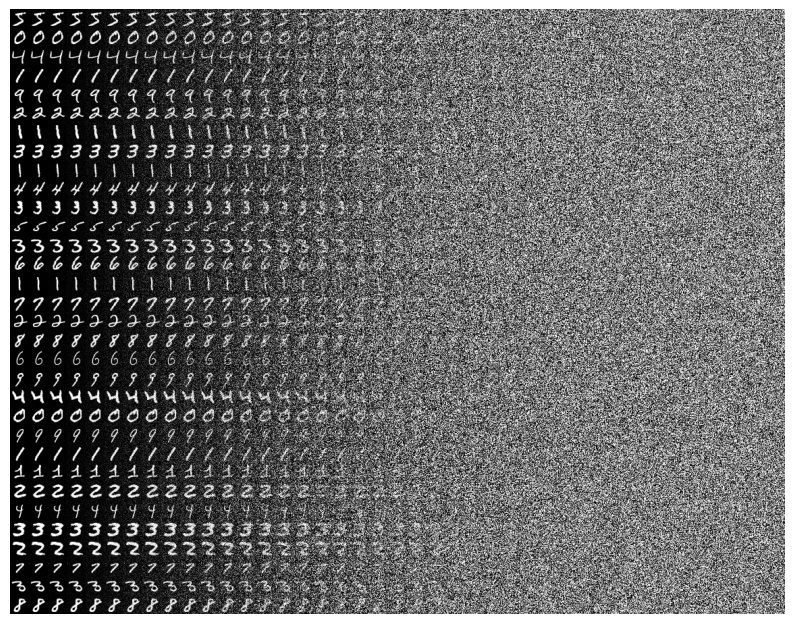

In [14]:
traj_forward = []
for t_val in np.arange(0, 1.01, 0.025):
    # print(f't_val is {t_val}')
    t = torch.ones(sample_data.shape[0], device=sample_data.device) * t_val
    #t has sahpe 32
    xt = diffusion.sample_t_0(sample_data, t)
    #xt has shape torch.Size([32, 1, 28, 28])
    traj_forward.append(xt.cpu())
    mean = torch.mean(xt.cpu())
    std = torch.std(xt.cpu())
    print(f"t = {t_val:.4f}, mean = {mean:.4f}, std = {std:.4f}")
show_traj(traj_forward)


# Q3: Training diffusion models
Implement the methods to run the following training loop.

469it [00:55,  8.40it/s]


Epoch 0, Average Loss = 0.47459569319224815


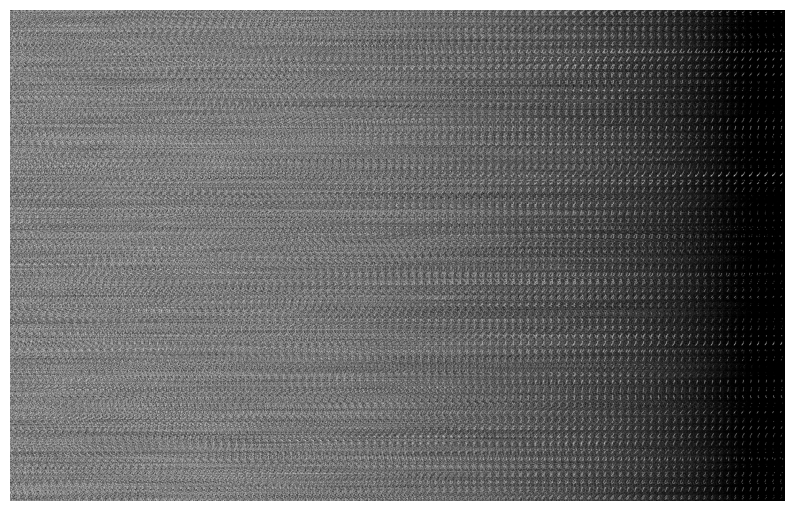

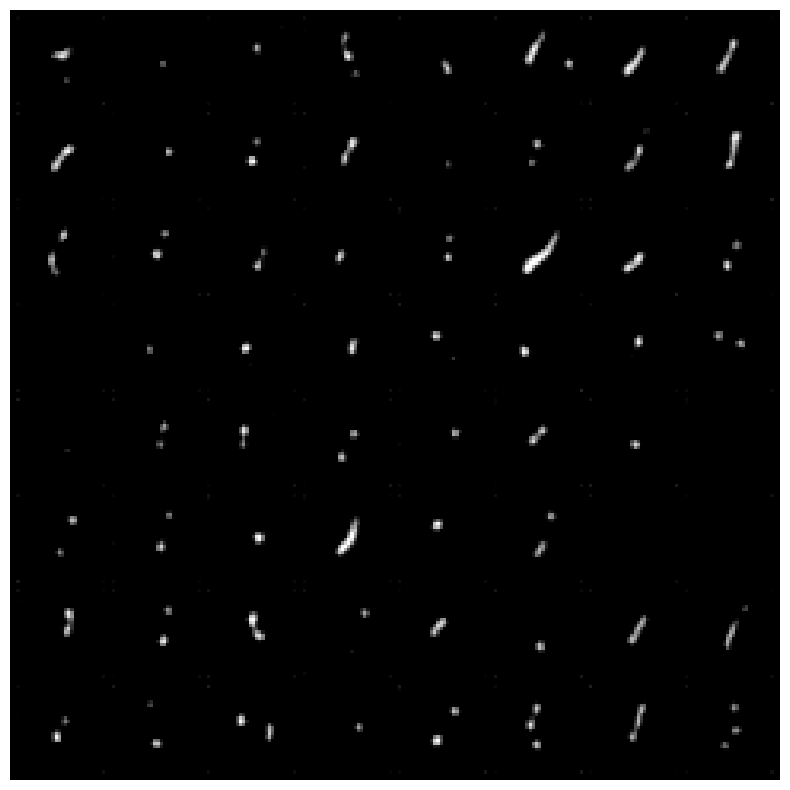

469it [00:56,  8.37it/s]


Epoch 1, Average Loss = 0.16985676671142008


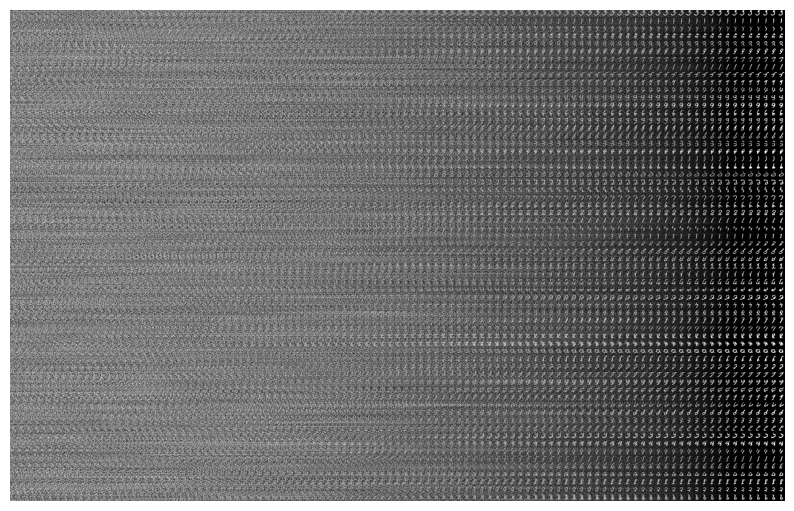

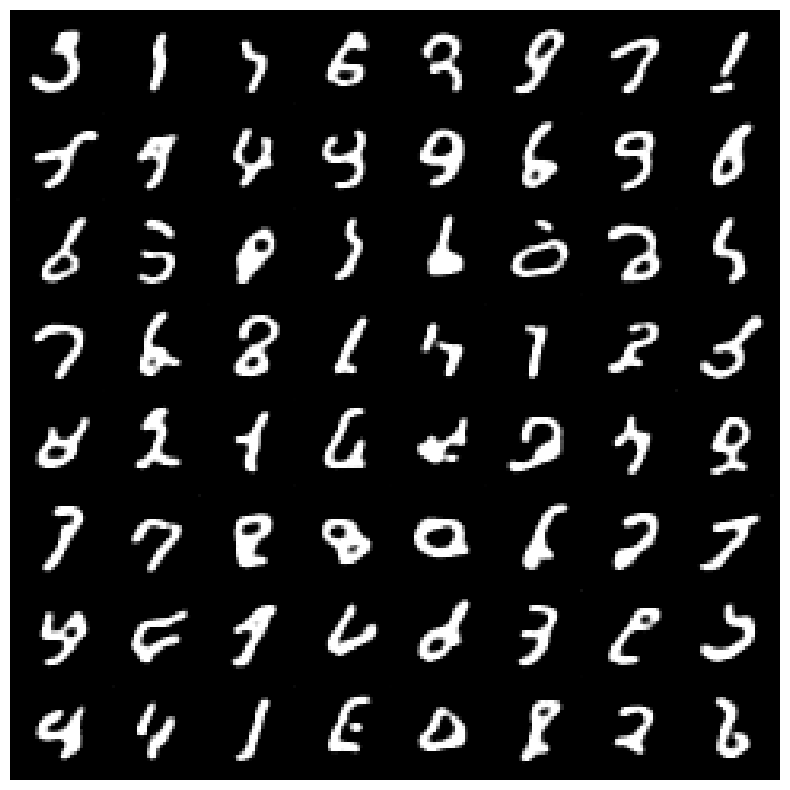

469it [00:58,  7.95it/s]


Epoch 2, Average Loss = 0.15511096368974714


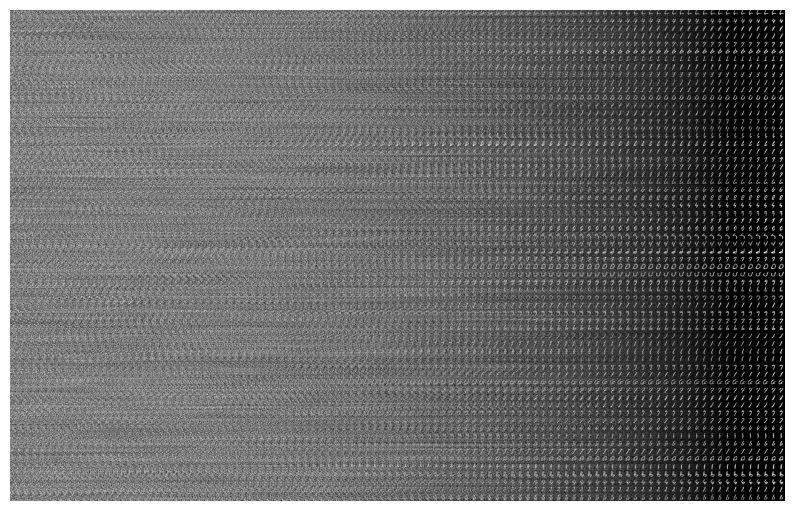

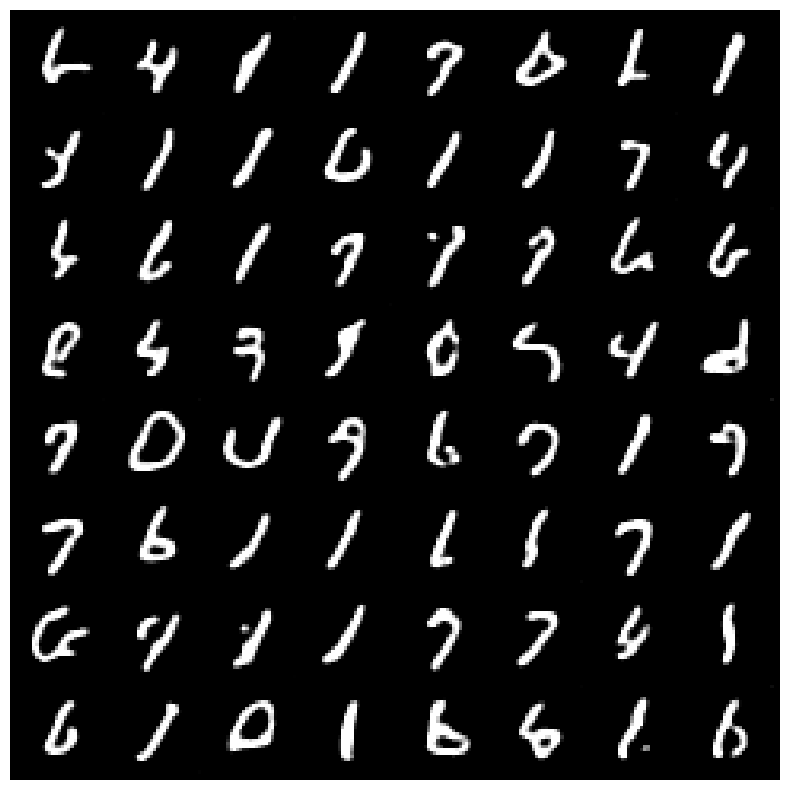

469it [00:58,  7.95it/s]


Epoch 3, Average Loss = 0.15202557586276455


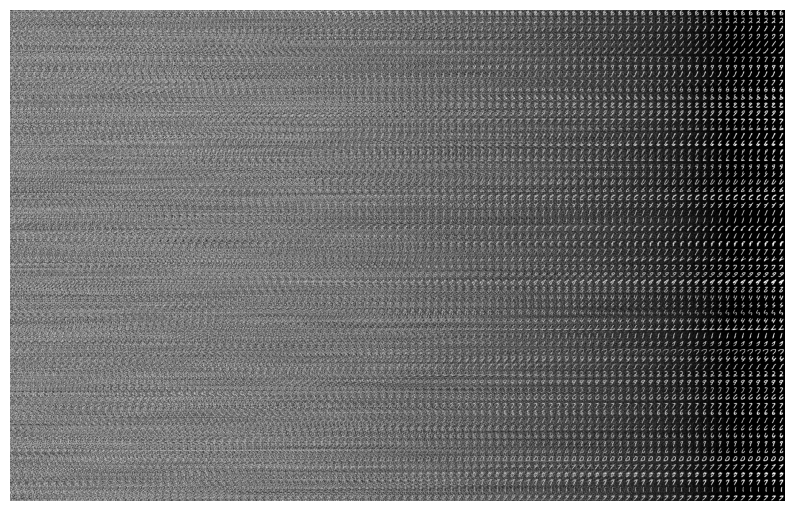

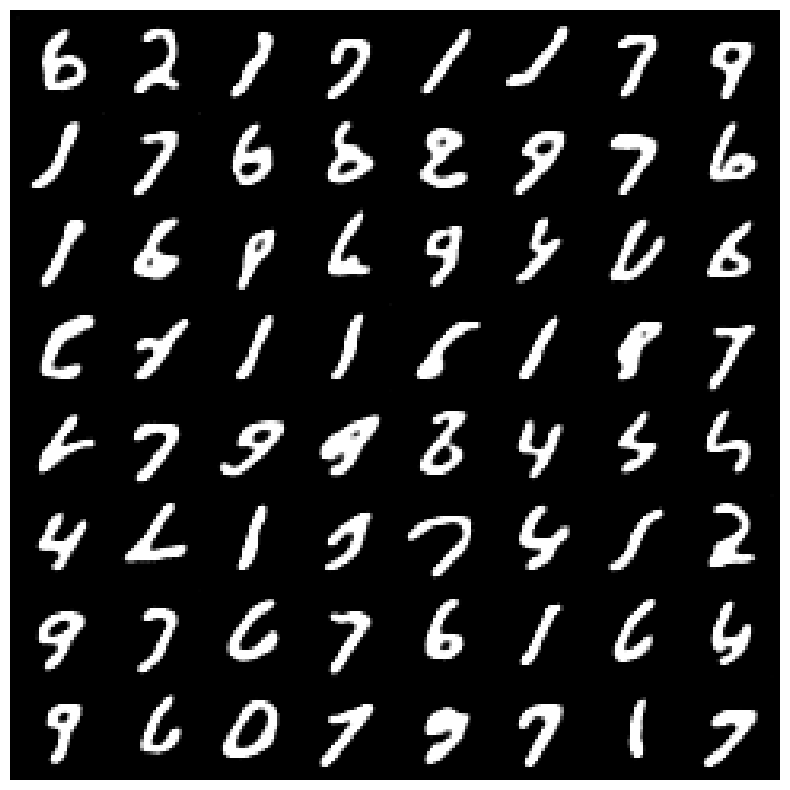

469it [01:00,  7.77it/s]


Epoch 4, Average Loss = 0.15073270136232314


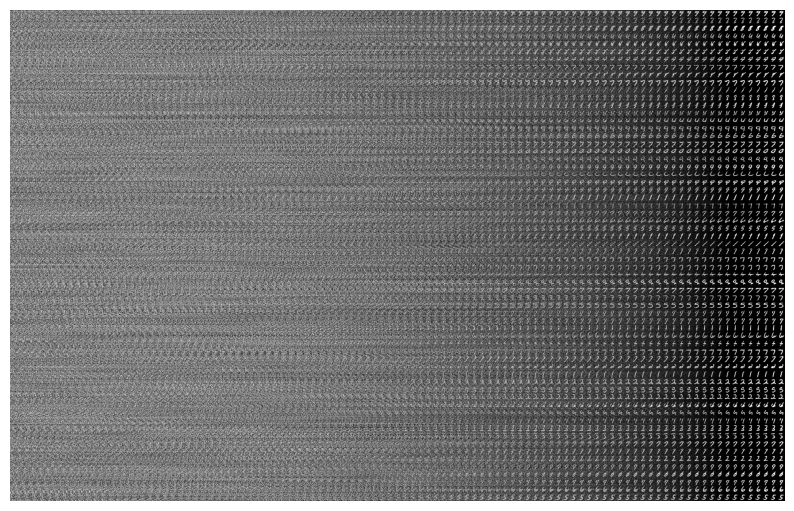

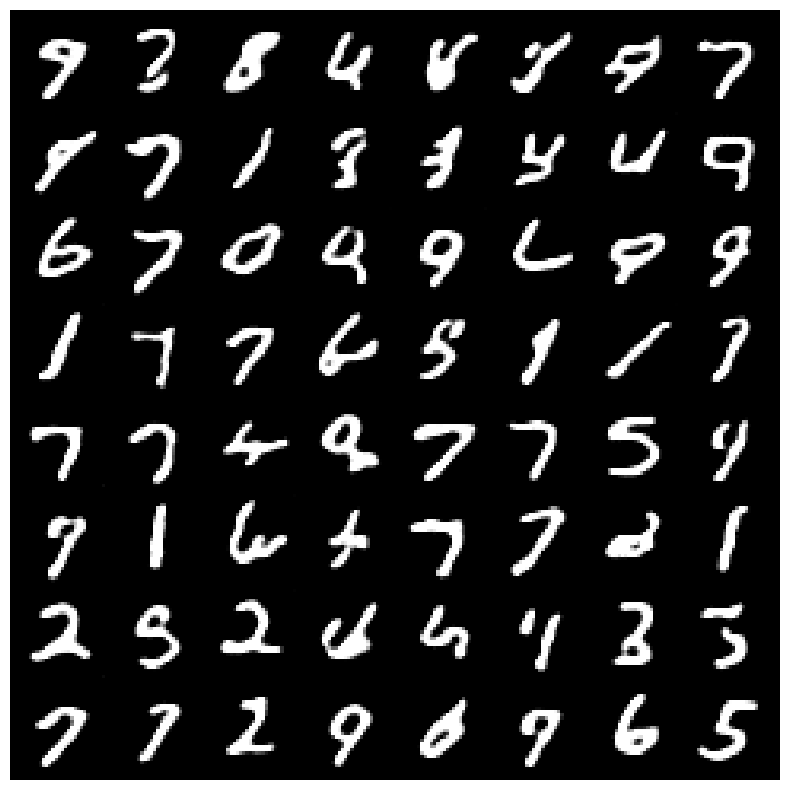

469it [01:02,  7.52it/s]


Epoch 5, Average Loss = 0.14911075673504934


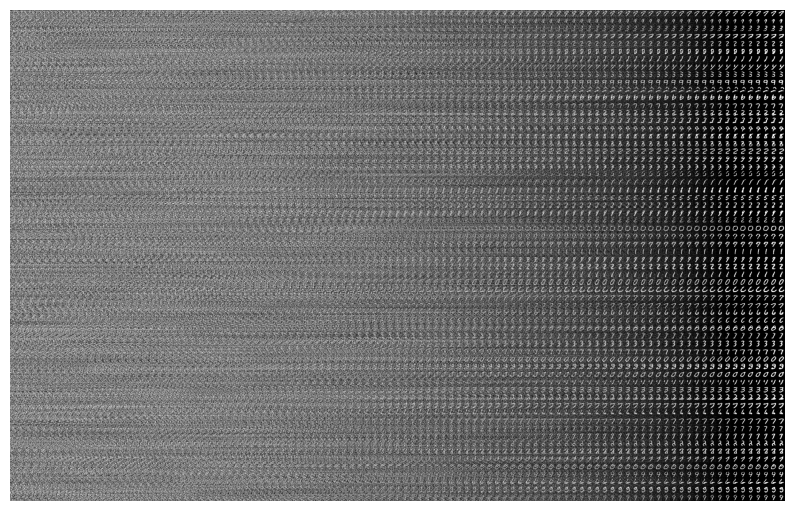

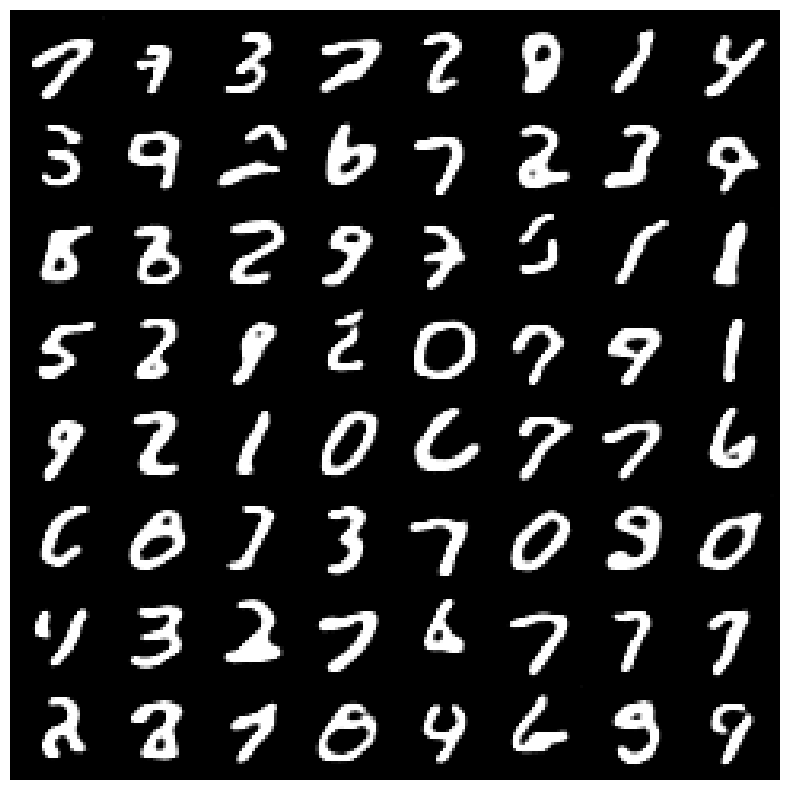

469it [01:02,  7.50it/s]


Epoch 6, Average Loss = 0.14805978114035592


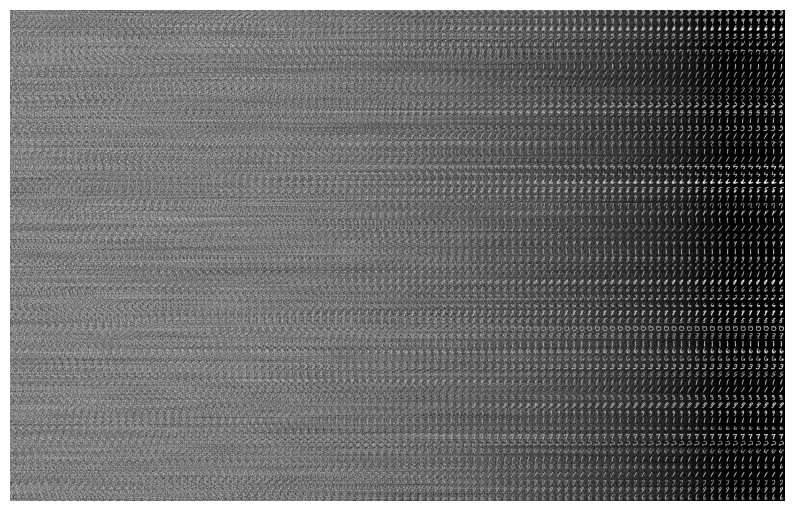

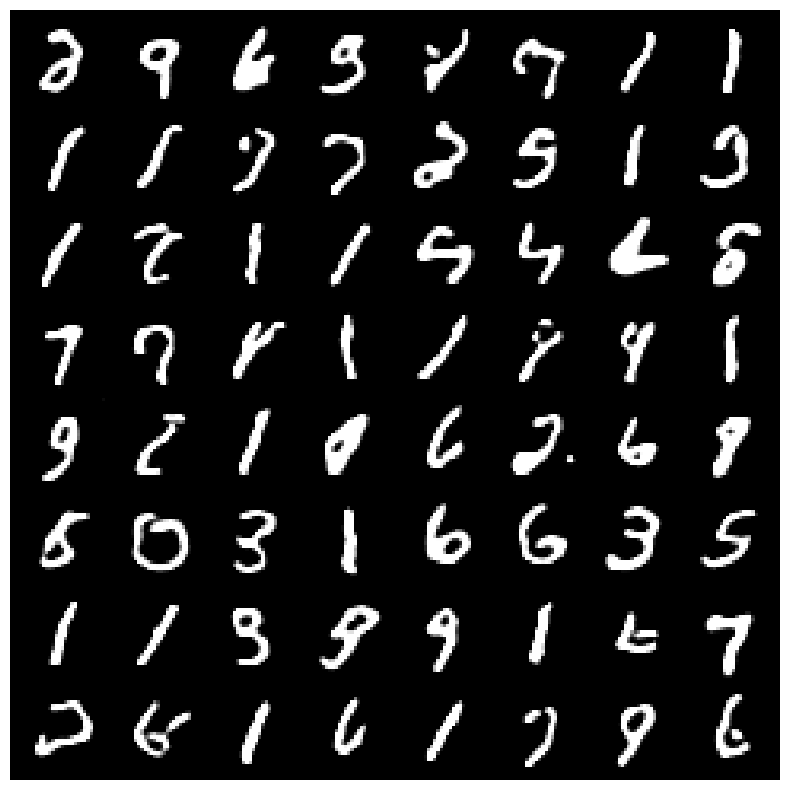

469it [01:05,  7.20it/s]


Epoch 7, Average Loss = 0.14795283585596186


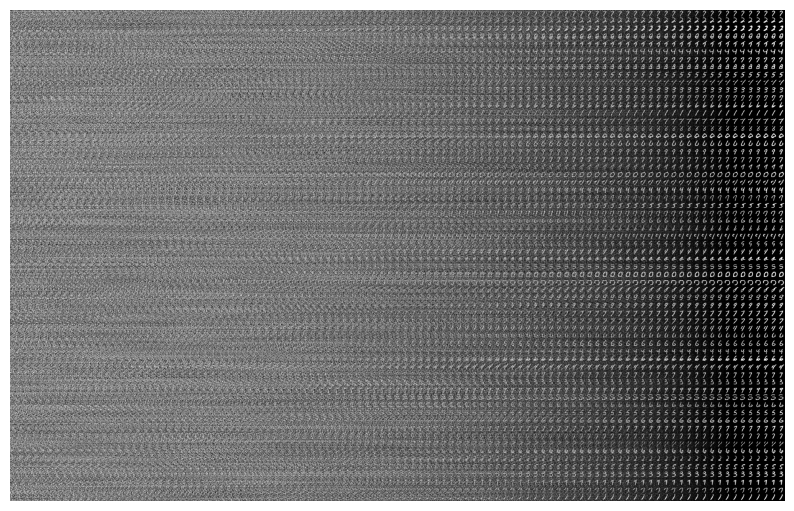

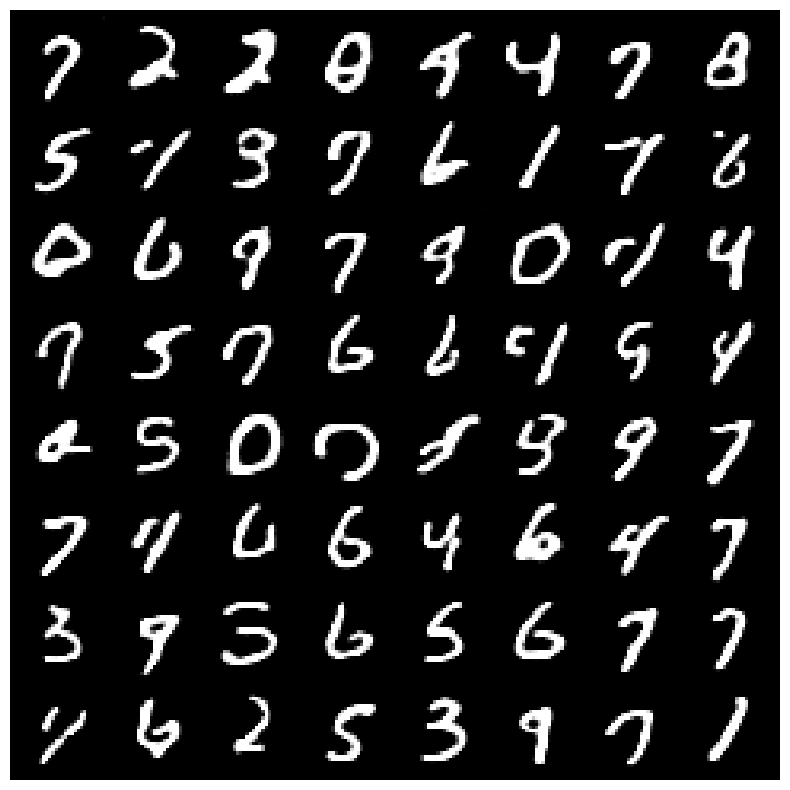

469it [01:04,  7.31it/s]


Epoch 8, Average Loss = 0.14717520147498483


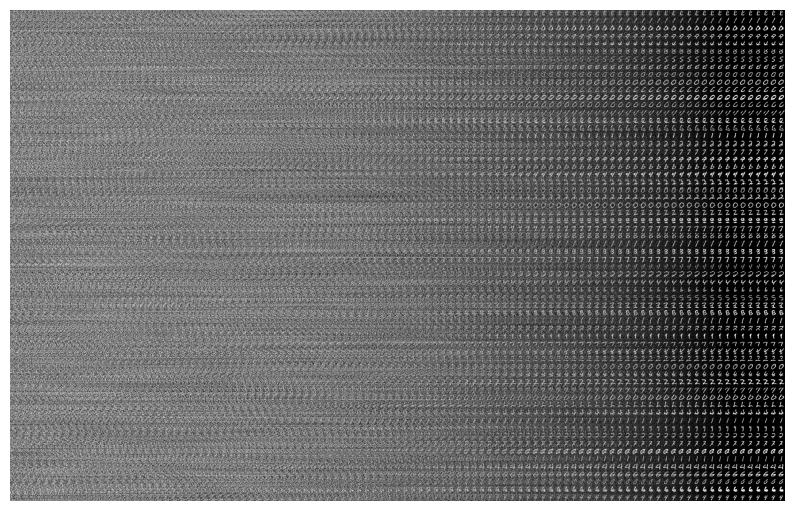

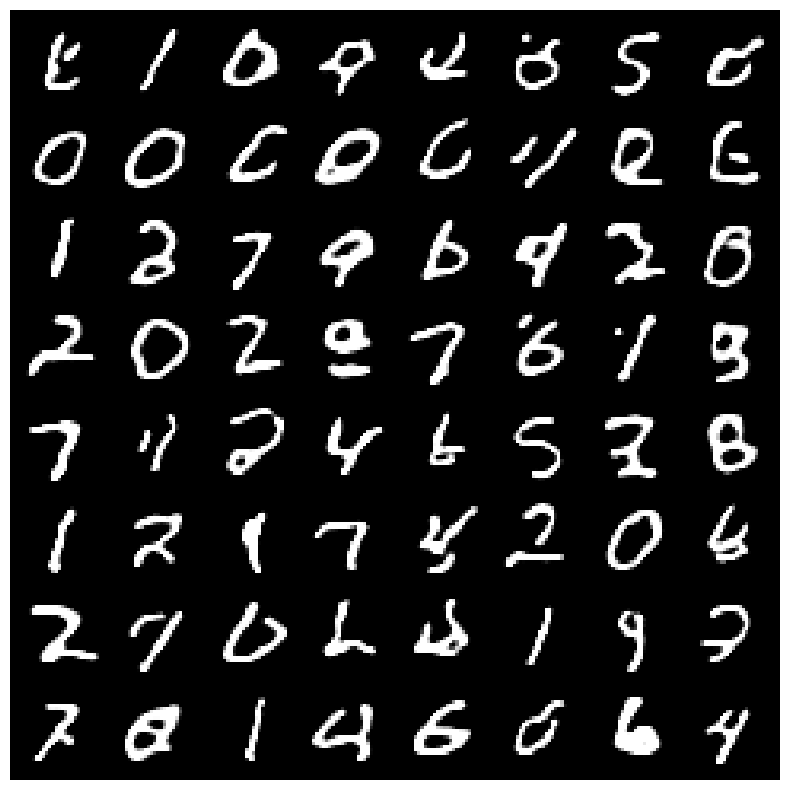

469it [01:07,  6.97it/s]


Epoch 9, Average Loss = 0.14707095056835776


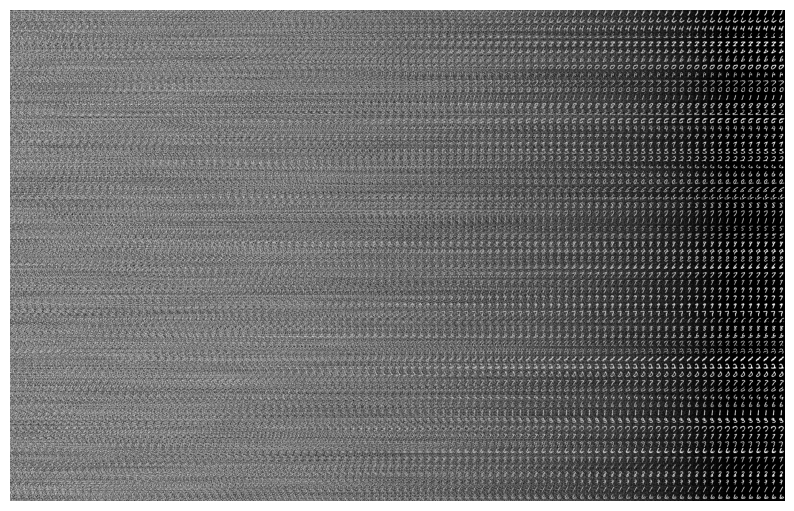

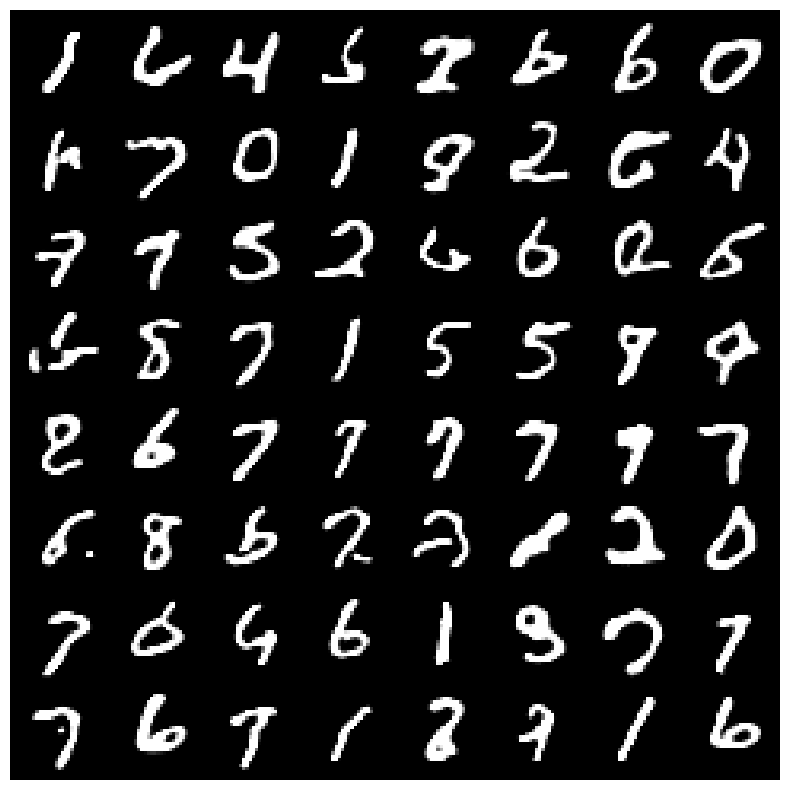

In [15]:
diffusion.net.to(device)
num_epochs = 10
x1 = torch.randn(64, 1, res, res).to(device)

for epoch in range(num_epochs):
    total_loss = 0  # Variable to accumulate the loss over the epoch
    for batch_idx, (x, _) in tqdm(enumerate(train_loader)):
        x = x.to(device)
        diffusion.net.train()
        optimizer.zero_grad()
        t = diffusion.sample_uniform(x.shape[0]).to(device)
        t = t / (1 - 1e-3) + 1e-3
        ##### Fill in

        xt = diffusion.sample_t_0(x, t)
        # model_output = diffusion.forward(xt, t)
        loss = diffusion.compute_loss(xt, x, t)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

    avg_loss = total_loss / len(train_loader)
        #####
    print(f"Epoch {epoch}, Average Loss = {avg_loss}")

    with torch.no_grad():
        score_net = lambda xt, t: diffusion.x_to_score(diffusion.net(xt, t), xt, t)
        traj_reverse = diffusion.sample_reverse(x1, score_net)

    show_traj(traj_reverse)

    # Plot samples
    samples = traj_reverse[-1] * 0.5 + 0.5
    plt.figure(figsize=(10, 10))
    plt.imshow(make_grid(samples, nrow=8).permute(1, 2, 0).cpu().numpy())
    plt.axis('off')
    plt.show()
